In [1]:
import joblib
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

from imblearn.over_sampling import SMOTE

import shap
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import RandomForestClassifier

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

from sklearn.feature_selection import mutual_info_classif

In [2]:
df = pd.read_csv("C:/Users/kisha/Documents/Uni-Stuff/Dissertation/books/git/data_cleaned_no_weight.csv")

In [3]:
#test train split
X = df.drop(columns=['Winner'])
y = df['Winner']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

#smote
smote = SMOTE(sampling_strategy='minority')
X_train, y_train = smote.fit_resample(X_train, y_train)

#scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [4]:
best_lr = joblib.load('savedModels/best_model_lr.pkl')

LOGISTIC SHAPLEY
---

In [5]:
#shapley values for the best model
#explainer_logistic = shap.Explainer(best_lr, X_train)

explainer_logistic = shap.LinearExplainer(best_lr, X_train, feature_names=X.columns)
shap_values_logistic = explainer_logistic.shap_values(X_train)

shap_values_explanation_logistic = shap.Explanation(values=shap_values_logistic, 
                                           base_values=explainer_logistic.expected_value, 
                                           data=X_train, 
                                           feature_names=X.columns)


In [6]:
print(shap_values_logistic.shape)

(5674, 145)


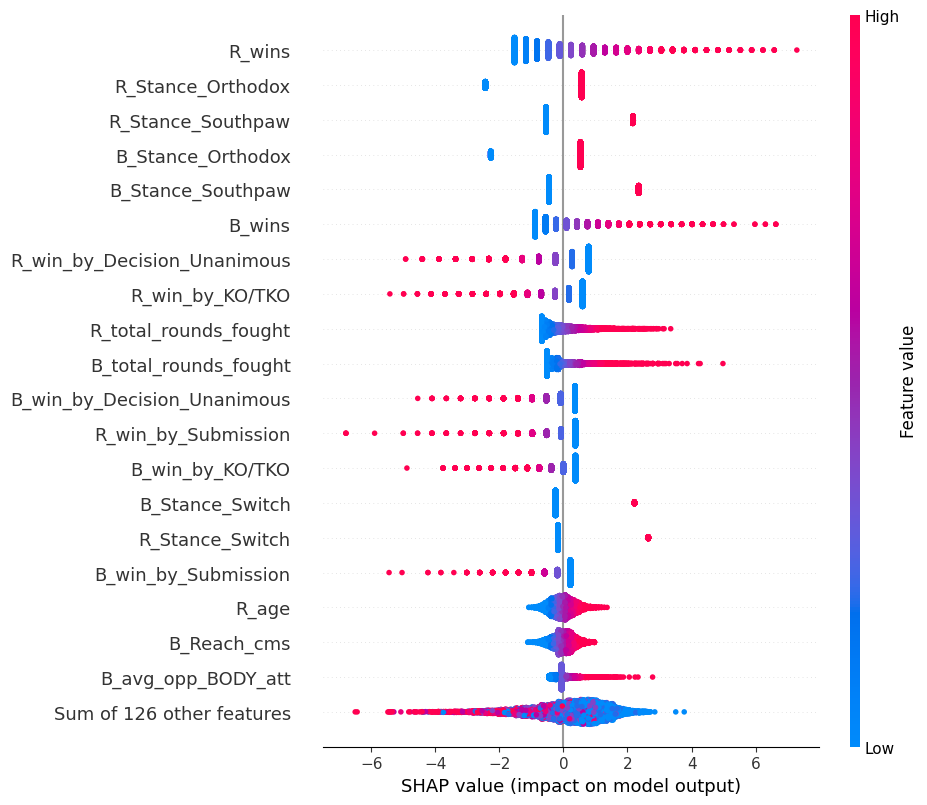

In [7]:
shap.plots.beeswarm(shap_values_explanation_logistic, max_display=20)

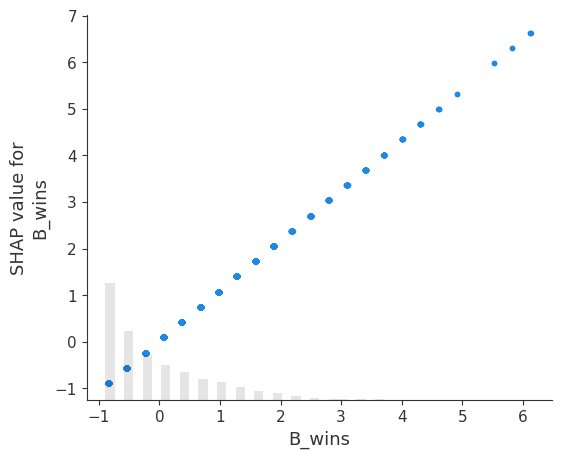

In [8]:
shap.plots.scatter(shap_values_explanation_logistic[:, 'B_wins'])

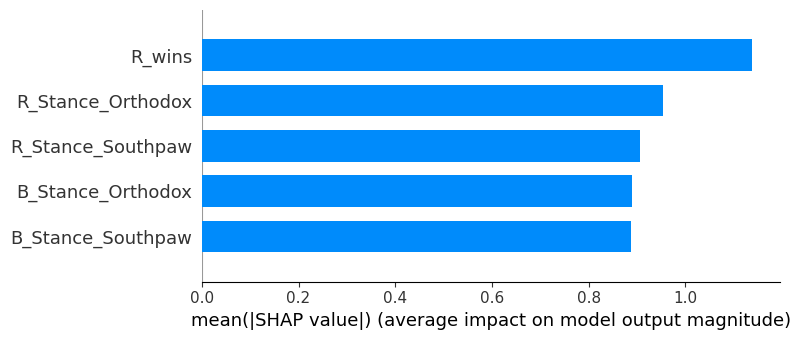

<Figure size 640x480 with 0 Axes>

In [9]:
plt.figure(figsize=(16, 12))
shap.summary_plot(shap_values_logistic, X_train, feature_names=X.columns, plot_type='bar', max_display=5)
plt.tight_layout()
plt.show()

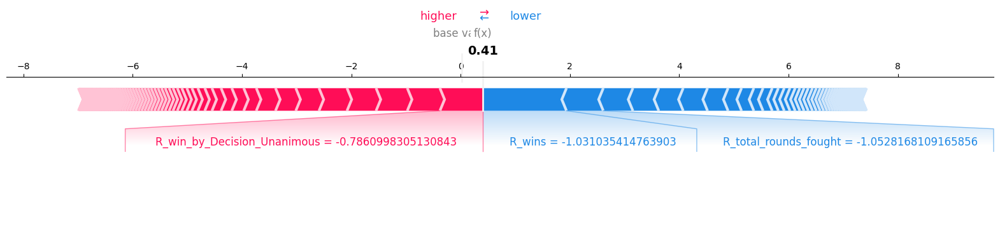

In [10]:
#force plot

logistic_forceplot= shap.force_plot(
    explainer_logistic.expected_value, 
    shap_values_logistic[0, :], 
    X_train[0, :], 
    feature_names=X.columns, 
    matplotlib=True
)



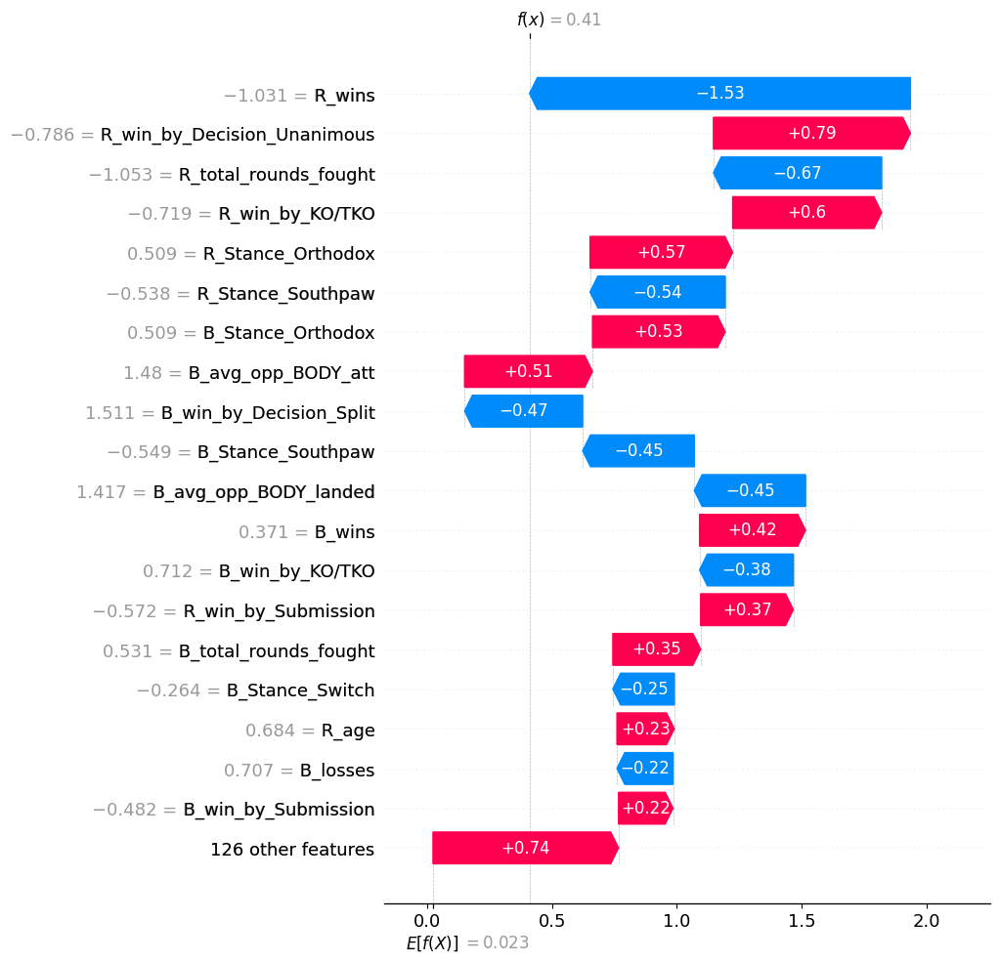

In [11]:
#waterfall plot


shap.plots.waterfall(shap_values_explanation_logistic[0], max_display=20)


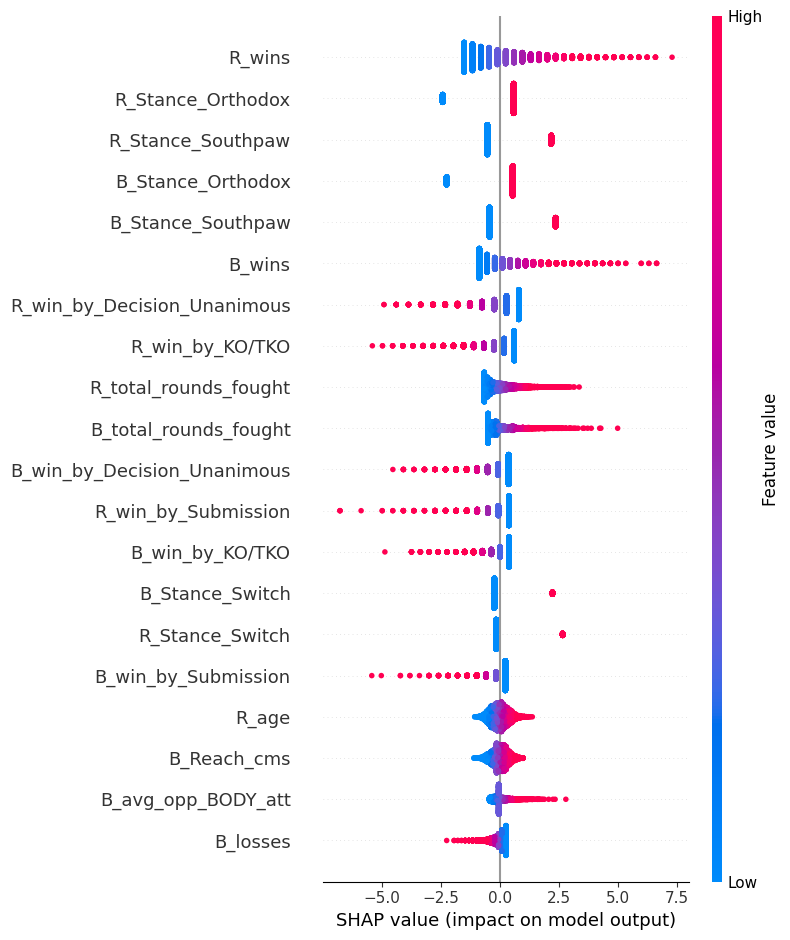

In [12]:
#summary bee swarm plot

shap.summary_plot(shap_values_logistic, X_train, feature_names=X.columns)

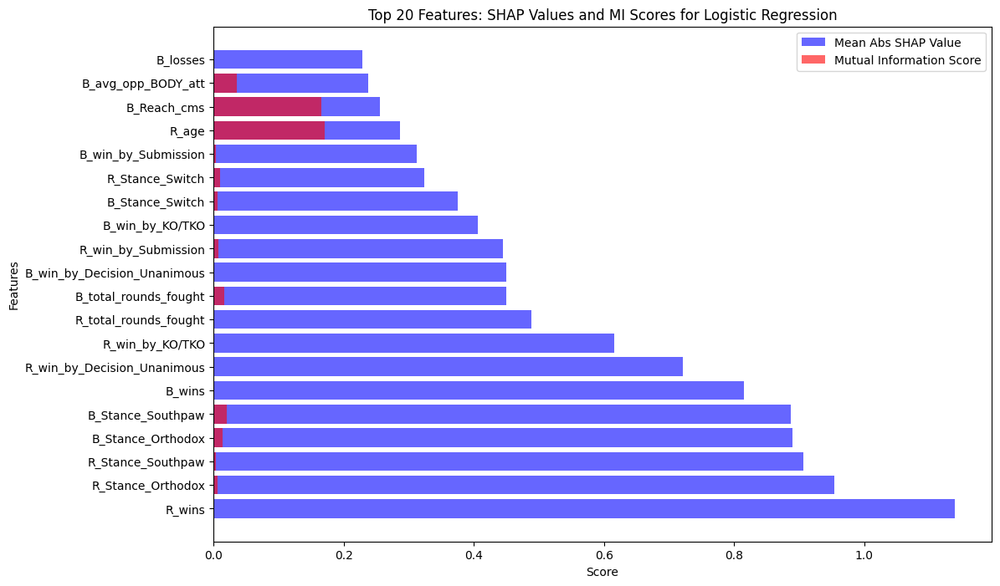

In [45]:
mean_abs_shap_values_lr = np.mean(np.abs(shap_values_logistic), axis=0)
shap_df_lr = pd.DataFrame({'feature': X.columns, 'mean_abs_shap_value': mean_abs_shap_values_lr})
shap_df_lr = shap_df_lr.sort_values(by='mean_abs_shap_value', ascending=False)
top_20_features_lr = shap_df_lr.head(20)

mi_scores = mutual_info_classif(X_train, y_train)
mi_df = pd.DataFrame({'feature': X.columns, 'mi_score': mi_scores})
top_20_features_lr = top_20_features_lr.merge(mi_df, on='feature')

plt.figure(figsize=(12, 8))
plt.barh(top_20_features_lr['feature'], top_20_features_lr['mean_abs_shap_value'], color='blue', alpha=0.6, label='Mean Abs SHAP Value')
plt.barh(top_20_features_lr['feature'], top_20_features_lr['mi_score'], color='red', alpha=0.6, label='Mutual Information Score')
plt.xlabel('Score')
plt.ylabel('Features')
plt.title('Top 20 Features: SHAP Values and MI Scores for Logistic Regression')
plt.legend()
plt.show()

RANDOM FOREST SHAPLEY
---

In [14]:
best_rf = joblib.load('savedModels/best_model_rf.pkl')

In [15]:
#train random forest with Best Parameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}

rf = RandomForestClassifier(bootstrap=False, 
                            max_depth=None, 
                            min_samples_leaf=1, 
                            min_samples_split=2, 
                            n_estimators=300
                        )

rf.fit(X_train, y_train)


RandomForestClassifier(bootstrap=False, n_estimators=300)

In [16]:
#shapley values for the random forest model
from shap import TreeExplainer


explainer_rf_new = TreeExplainer(rf)

shap_values_rf_new = explainer_rf_new.shap_values(X_train)

shap_rf_array_new = np.array(shap_values_rf_new)

In [ ]:
print(shap_rf_array_new.shape)

(5674, 145, 2)


In [ ]:
shap_values_class_1 = shap_rf_array_new[:, :, 0]

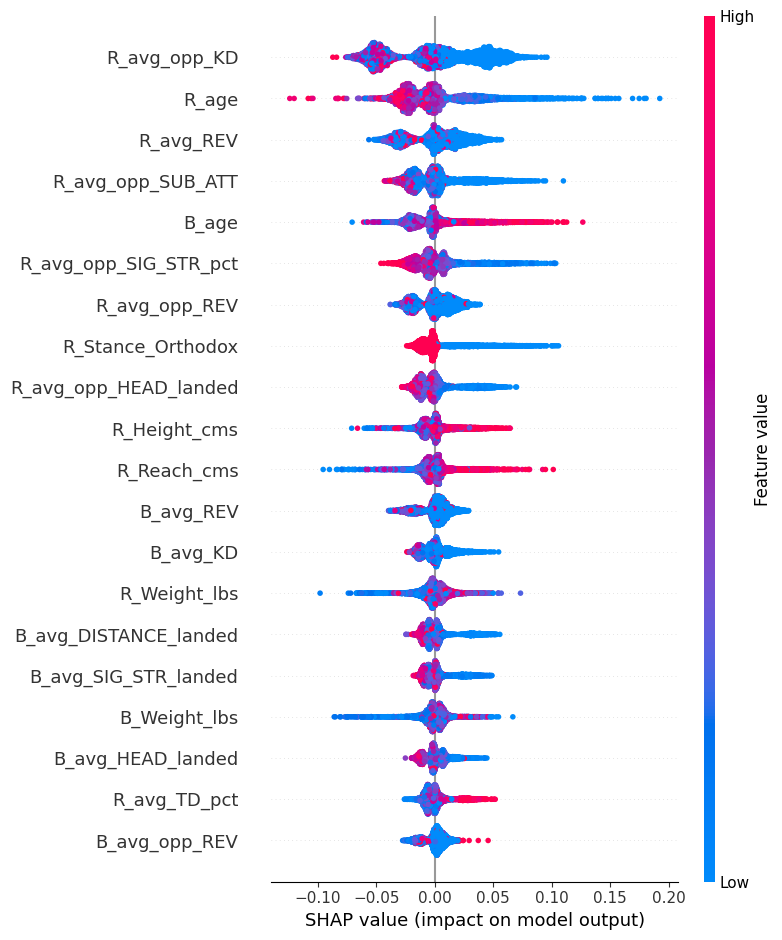

In [ ]:
shap.summary_plot(shap_values_class_1, X_train, feature_names=X.columns)

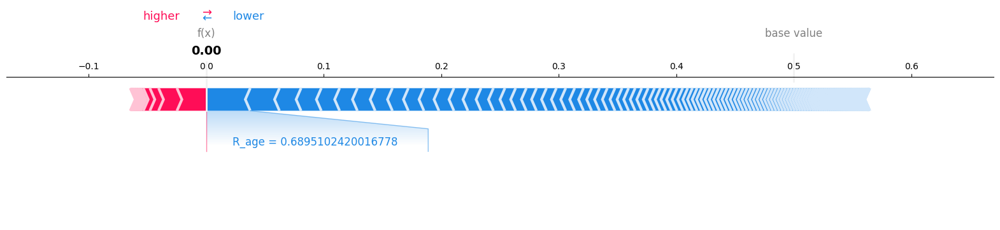

In [ ]:
base_value_rf1 = explainer_rf_new.expected_value[0]

shap_values_for_instance = shap_values_class_1[0, :]


shap.force_plot(
    base_value_rf1, 
    shap_values_for_instance, 
    X_train[0, :], 
    feature_names=X.columns,
    matplotlib=True
)

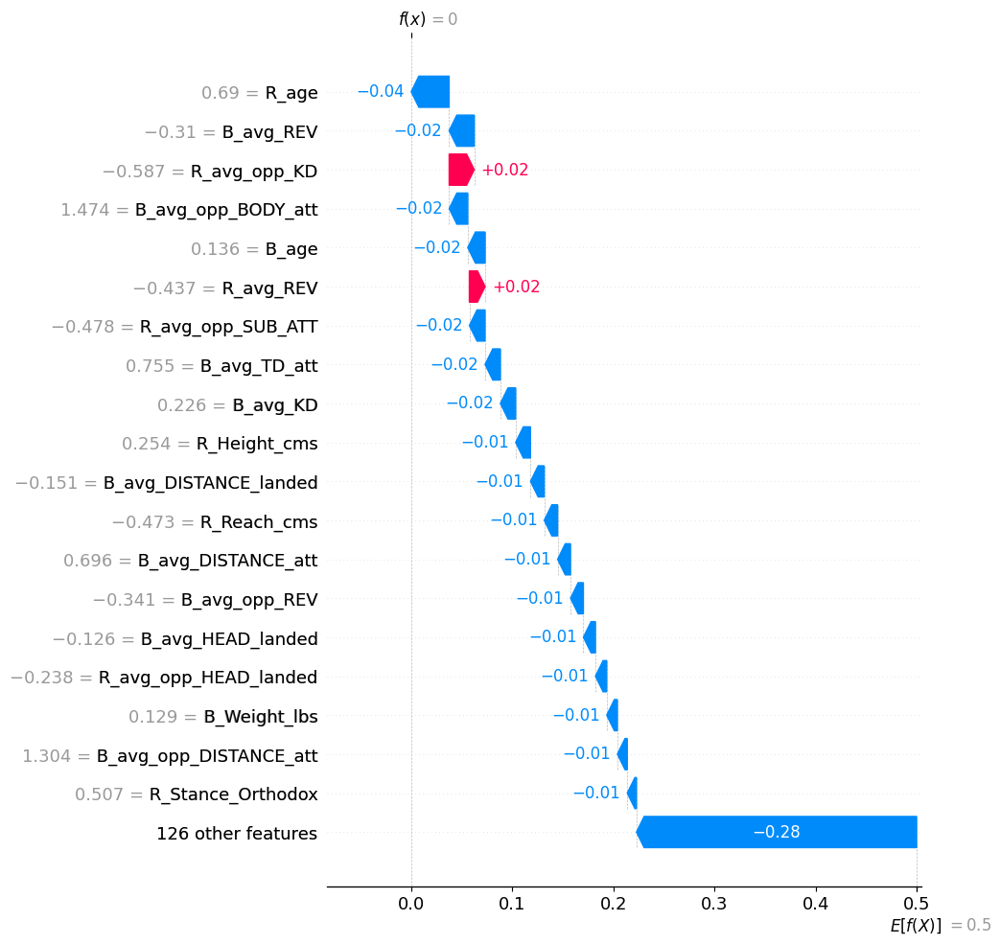

In [ ]:
shap.waterfall_plot(
    shap.Explanation(
        values=shap_values_for_instance, 
        base_values=explainer_rf_new.expected_value[0],  # Base value for class 1
        data=X_train[0, :], 
        feature_names=X.columns
    ),
    max_display=20  # Adjust the number of features to display if necessary
)

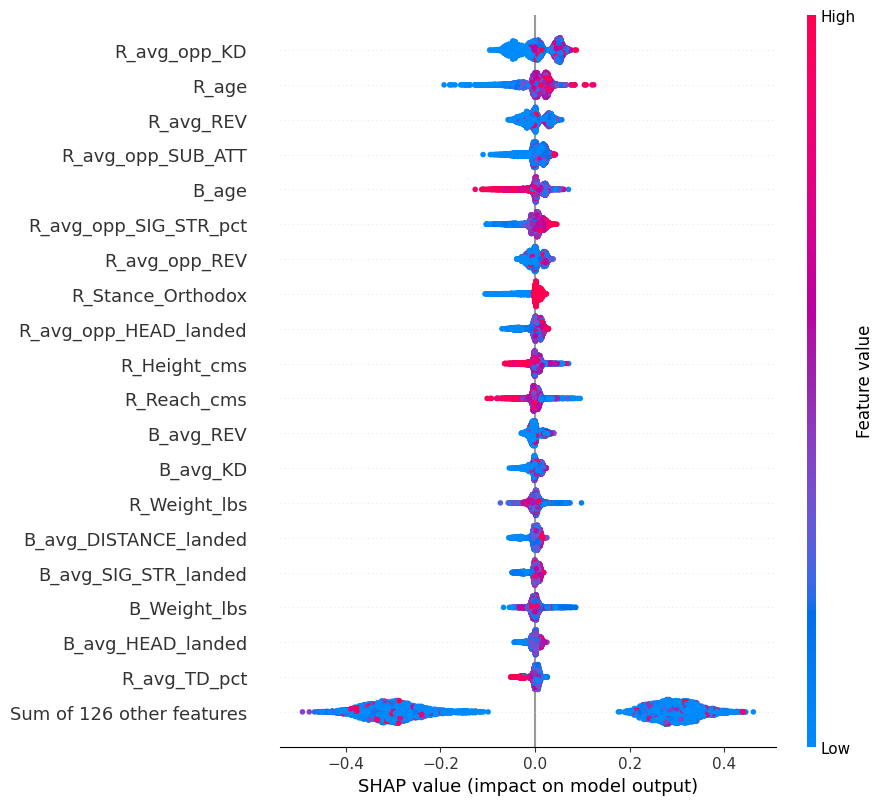

In [ ]:
#beeswarm plot

shap_values_reshaped_rf = shap_rf_array_new.reshape(X_train.shape[0], X_train.shape[1], 2)

shap_values_for_class_0 = shap_values_reshaped_rf[:, :, 1]

shap_values_explanation_rf = shap.Explanation(
    values=shap_values_for_class_0,
    base_values=explainer_rf_new.expected_value, 
    data=X_train, 
    feature_names=X.columns
)

shap.plots.beeswarm(shap_values_explanation_rf, max_display=20)

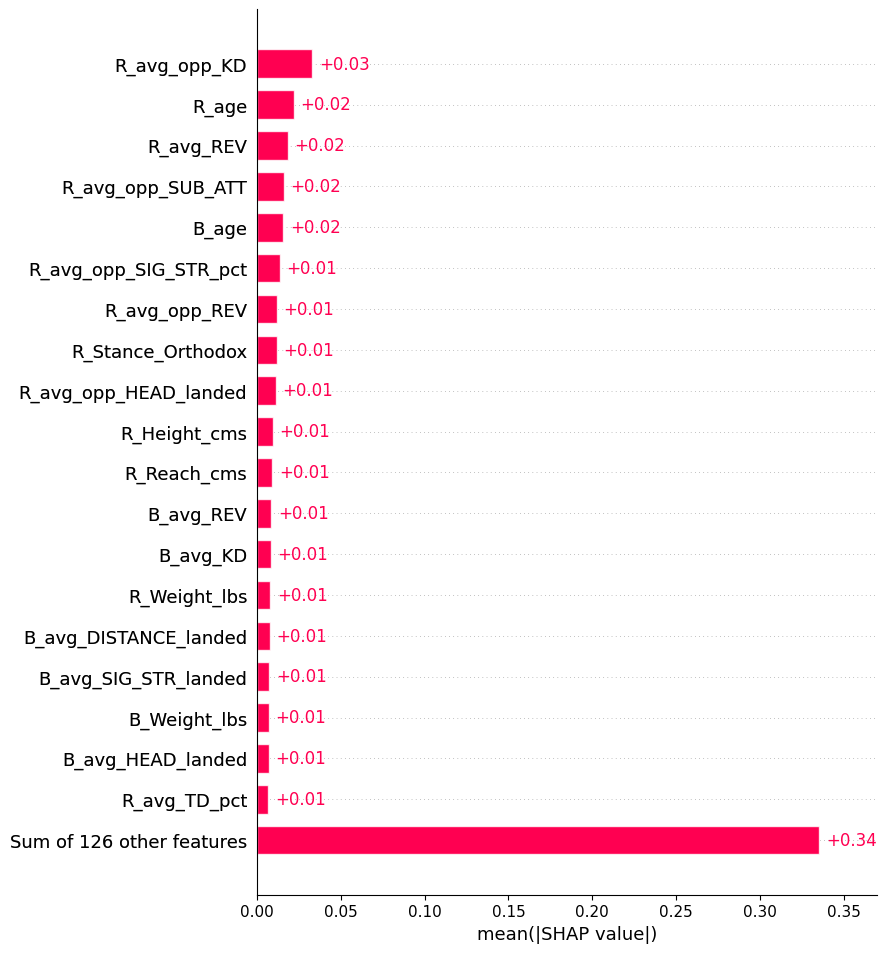

In [ ]:
#bar plot

shap.plots.bar(shap_values_explanation_rf, max_display=20)

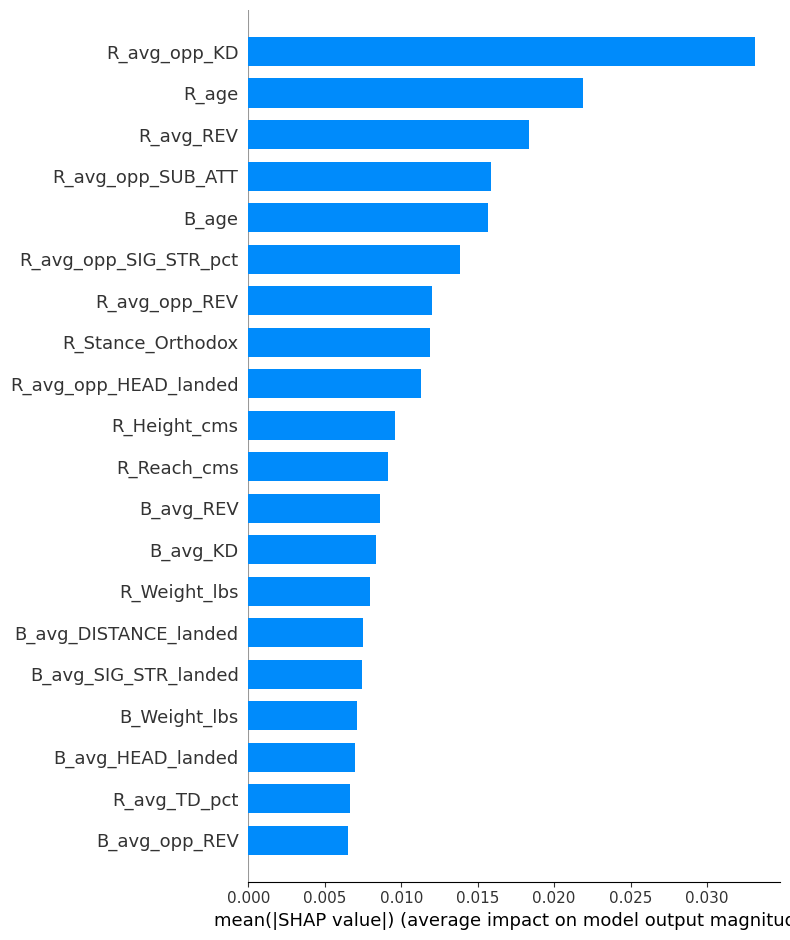

In [ ]:
#bar plot

shap.summary_plot(shap_values_for_class_0, X_train, feature_names=X.columns, plot_type='bar')

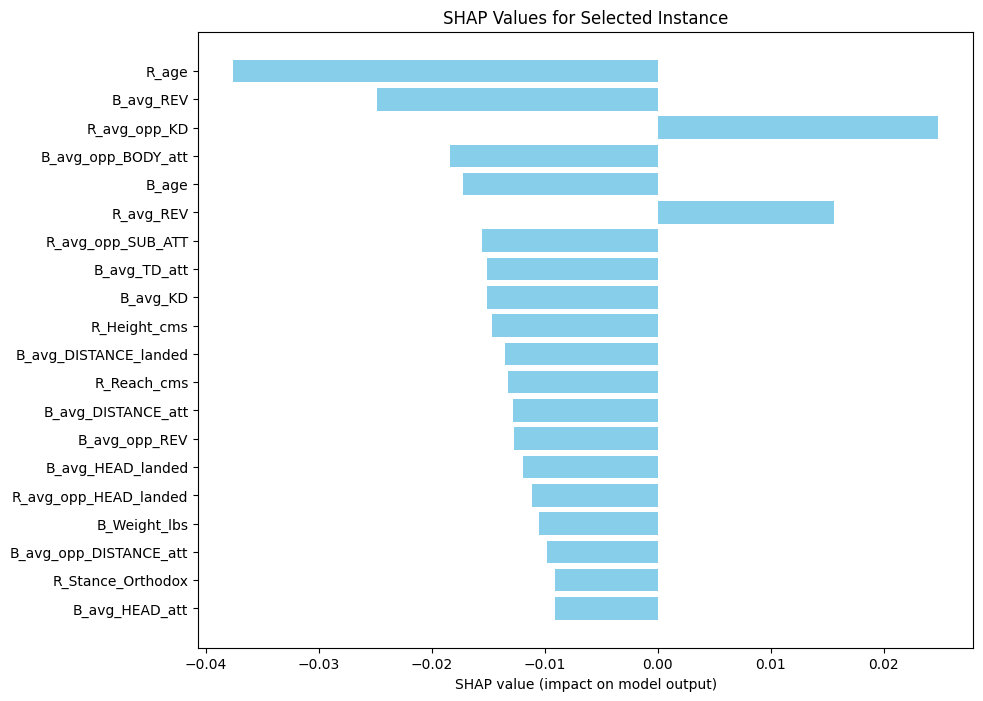

In [ ]:
sorted_indices = np.argsort(np.abs(shap_values_for_instance))[::-1]
sorted_shap_values = shap_values_for_instance[sorted_indices]
sorted_feature_names = X.columns[sorted_indices]

plt.figure(figsize=(10, 8))
plt.barh(sorted_feature_names[:20], sorted_shap_values[:20], color='skyblue')
plt.xlabel('SHAP value (impact on model output)')
plt.title('SHAP Values for Selected Instance')
plt.gca().invert_yaxis()
plt.show()

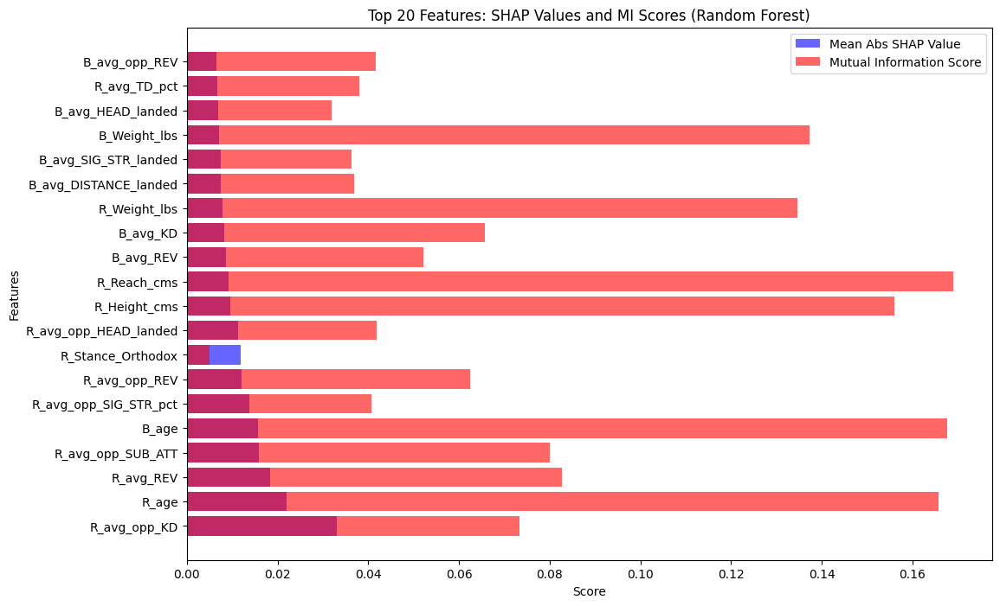

In [ ]:
mean_abs_shap_values_rf = np.mean(np.abs(shap_values_for_class_0), axis=0)

shap_df_rf = pd.DataFrame({
    'feature': X.columns,
    'mean_abs_shap_value_rf': mean_abs_shap_values_rf
})

shap_df_rf = shap_df_rf.sort_values(by='mean_abs_shap_value_rf', ascending=False)

top_20_features_rf = shap_df_rf.head(20)

top_20_features_rf = top_20_features_rf.merge(mi_df, on='feature')

plt.figure(figsize=(12, 8))
plt.barh(top_20_features_rf['feature'], top_20_features_rf['mean_abs_shap_value_rf'], color='blue', alpha=0.6, label='Mean Abs SHAP Value')
plt.barh(top_20_features_rf['feature'], top_20_features_rf['mi_score'], color='red', alpha=0.6, label='Mutual Information Score')
plt.xlabel('Score')
plt.ylabel('Features')
plt.title('Top 20 Features: SHAP Values and MI Scores (Random Forest)')
plt.legend()
plt.show()

XGB SHAPLEY
---

In [14]:
best_xgb = joblib.load('savedModels/best_model_xgb.pkl')

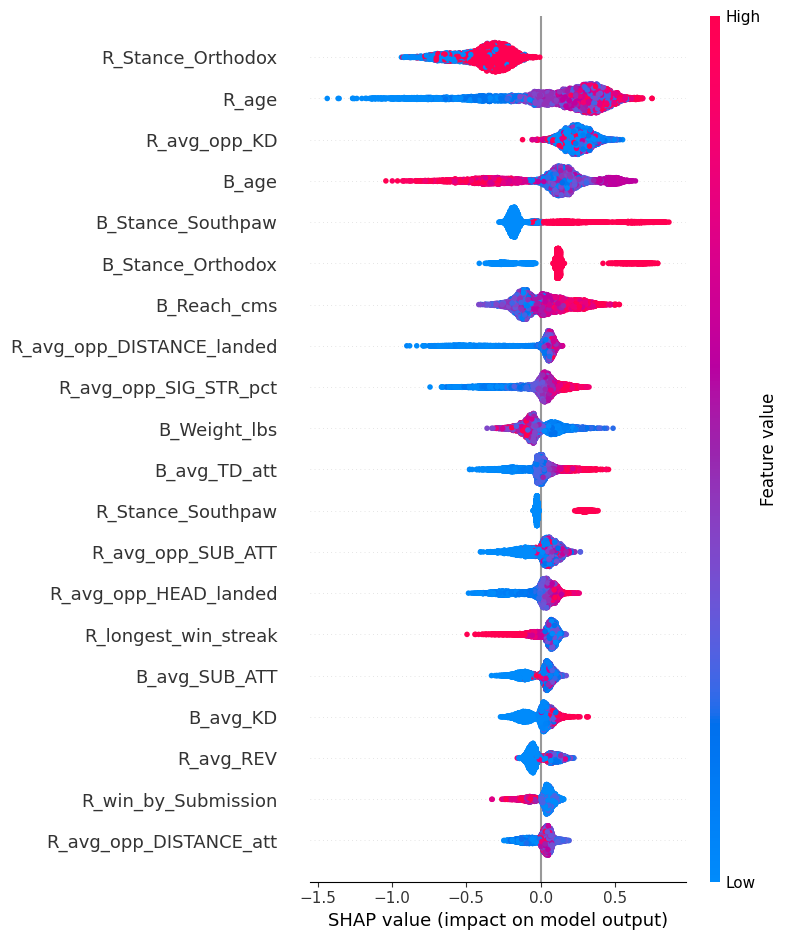

In [15]:
#shapley values for the best model
explainer_xgb = shap.TreeExplainer(best_xgb)

shap_values_xgb = explainer_xgb.shap_values(X_train)

shap.summary_plot(shap_values_xgb, X_train, feature_names=X.columns)



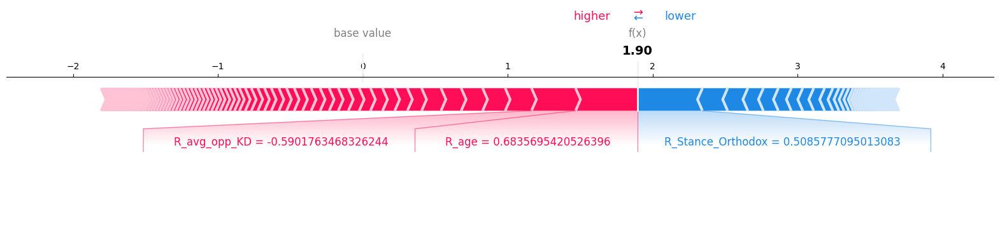

In [16]:
#FORCE PLOT

xgb_forceplot= shap.force_plot(
    explainer_xgb.expected_value, 
    shap_values_xgb[0, :], 
    X_train[0, :], 
    feature_names=X.columns, 
    matplotlib=True
)

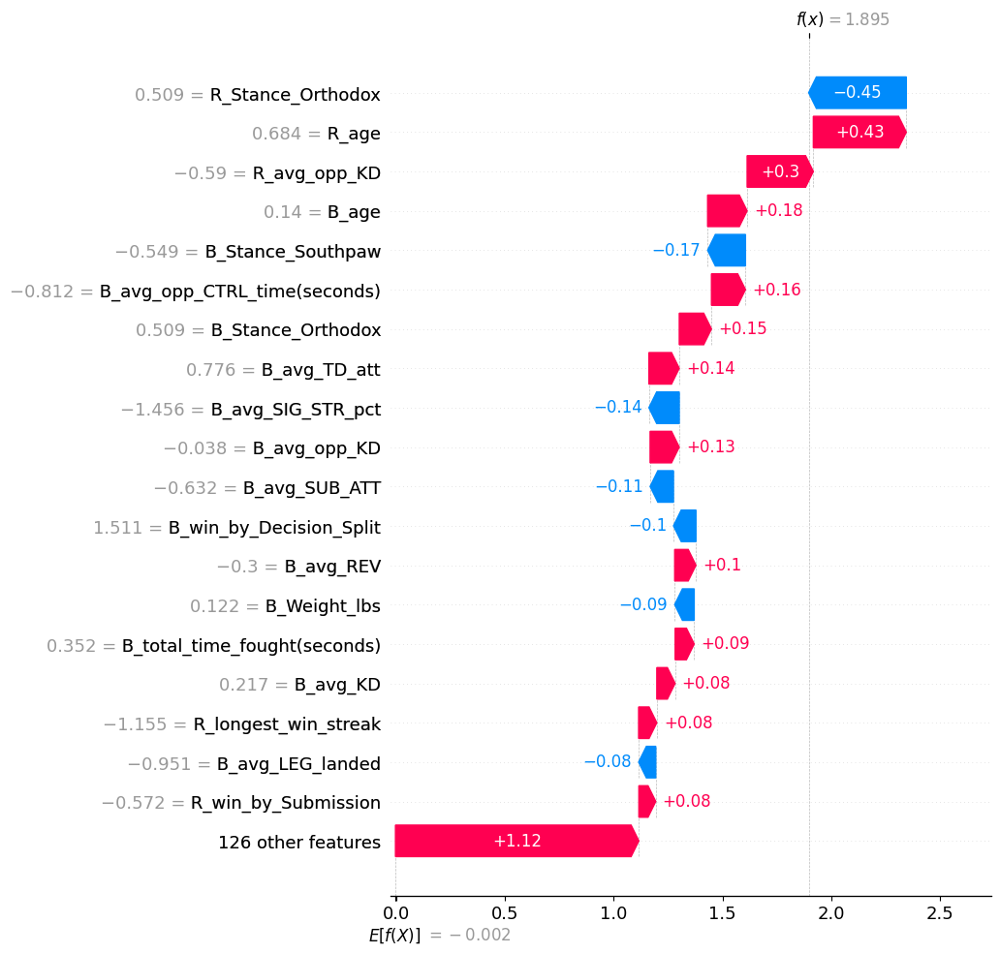

In [17]:
#waterfall plot
#epxlaination

shap_values_explanation_xgb = shap.Explanation(values=shap_values_xgb,
                                             base_values=explainer_xgb.expected_value,
                                             data=X_train,
                                             feature_names=X.columns)

shap.plots.waterfall(shap_values_explanation_xgb[0], max_display=20)

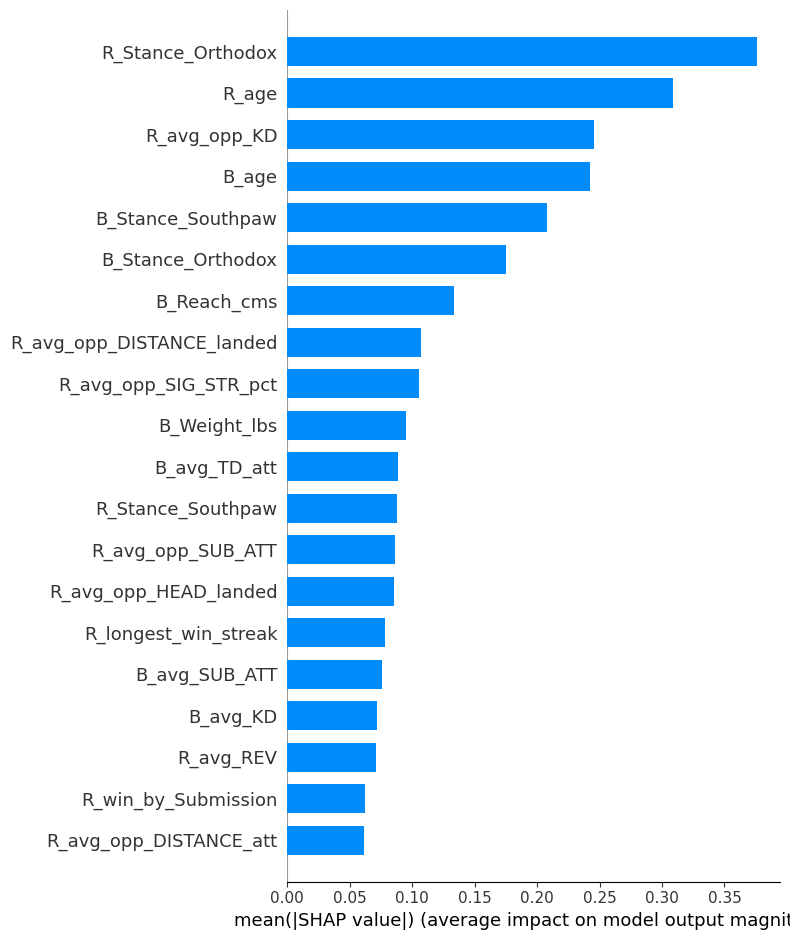

In [18]:
#bar plot


shap.summary_plot(shap_values_xgb, X_train, feature_names=X.columns, plot_type='bar', max_display=20)

In [19]:
print(np.array(shap_values_xgb).shape)

(5674, 145)


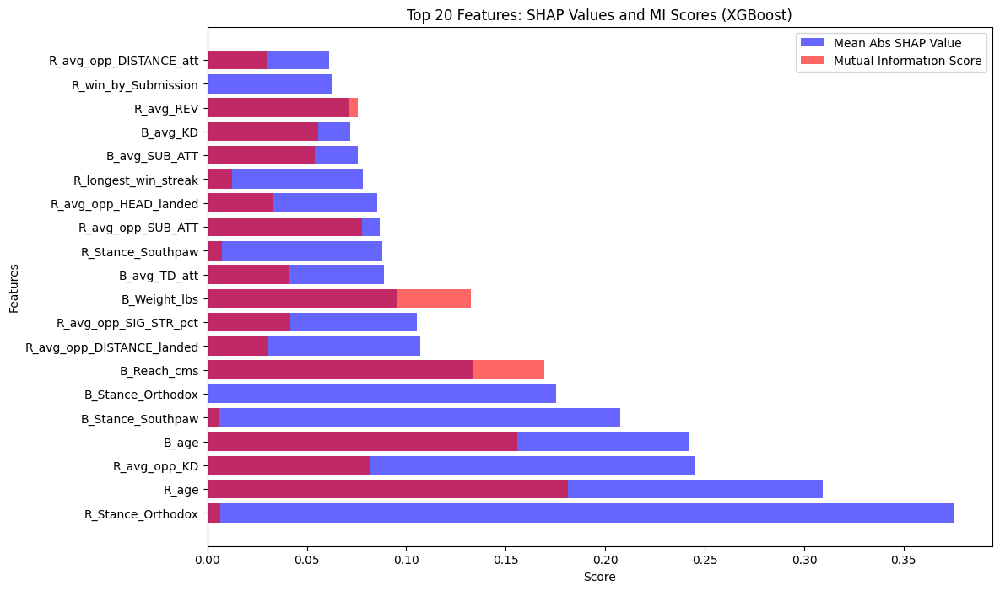

In [20]:
mean_abs_shap_values_xgb = np.mean(np.abs(shap_values_xgb), axis=0)

shap_df_xgb = pd.DataFrame({
    'feature': X.columns,
    'mean_abs_shap_value_xgb': mean_abs_shap_values_xgb
})

shap_df_xgb = shap_df_xgb.sort_values(by='mean_abs_shap_value_xgb', ascending=False)

top_20_features_xgb = shap_df_xgb.head(20)

top_20_features_xgb = top_20_features_xgb.merge(mi_df, on='feature')

plt.figure(figsize=(12, 8))
plt.barh(top_20_features_xgb['feature'], top_20_features_xgb['mean_abs_shap_value_xgb'], color='blue', alpha=0.6, label='Mean Abs SHAP Value')
plt.barh(top_20_features_xgb['feature'], top_20_features_xgb['mi_score'], color='red', alpha=0.6, label='Mutual Information Score')
plt.xlabel('Score')
plt.ylabel('Features')
plt.title('Top 20 Features: SHAP Values and MI Scores (XGBoost)')
plt.legend()
plt.show()

NEURAL NET SHAPLEY
---

In [21]:
#importing a saved deep learning model torch

best_deep = torch.load('savedModels/deep_model.pth')

In [22]:
train_features = torch.tensor(X_train, dtype=torch.float32)
train_labels = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)  # Correct placement of unsqueeze
test_features = torch.tensor(X_test, dtype=torch.float32)

# Prepare the dataset and dataloader with unique names
train_dataset_unique = TensorDataset(train_features, train_labels)
train_loader_unique = DataLoader(train_dataset_unique, batch_size=64, shuffle=True)

In [23]:
train_dataset_unique = TensorDataset(train_features, train_labels)
train_loader_unique = DataLoader(train_dataset_unique, batch_size=64, shuffle=True)

class DeepNet3(nn.Module):
    def __init__(self, input_dim):
        super(DeepNet3, self).__init__()
        self.layer1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.layer2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.layer3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.layer4 = nn.Linear(64, 32)
        self.bn4 = nn.BatchNorm1d(32)
        self.layer5 = nn.Linear(32, 16)
        self.bn5 = nn.BatchNorm1d(16)
        self.output_layer = nn.Linear(16, 1)
        self.dropout = nn.Dropout(p=0.5)
        self.activation = nn.ReLU()
        self.output_activation = nn.Sigmoid()

    def forward(self, x):
        x = self.dropout(self.activation(self.bn1(self.layer1(x))))
        x = self.dropout(self.activation(self.bn2(self.layer2(x))))
        x = self.dropout(self.activation(self.bn3(self.layer3(x))))
        x = self.dropout(self.activation(self.bn4(self.layer4(x))))
        x = self.dropout(self.activation(self.bn5(self.layer5(x))))
        x = self.output_activation(self.output_layer(x))
        return x

input_dim = 145
deep_model3 = DeepNet3(input_dim)

loss_function3 = nn.BCELoss()
optimizer3 = optim.Adam(deep_model3.parameters(), lr=0.001)

total_epochs = 50
deep_model3.train()
for epoch_num in range(total_epochs):
    accumulated_loss3 = 0.0
    for batch_features, batch_labels in train_loader_unique:
        batch_labels = batch_labels.view(-1,1)  # Remove extra dimensions if any
        optimizer3.zero_grad()
        batch_outputs = deep_model3(batch_features)
        batch_loss = loss_function3(batch_outputs, batch_labels)
        batch_loss.backward()
        optimizer3.step()

        accumulated_loss3 += batch_loss.item() * batch_features.size(0)

    avg_epoch_loss3 = accumulated_loss3 / len(train_loader_unique.dataset)
    print(f'Epoch {epoch_num+1}/{total_epochs}, Loss: {avg_epoch_loss3:.4f}')

deep_model3.eval()
with torch.no_grad():
    test_outputs3 = deep_model3(test_features)
    test_predictions3 = (test_outputs3.numpy() > 0.5).astype(int)



Epoch 1/50, Loss: 0.7251
Epoch 2/50, Loss: 0.6970
Epoch 3/50, Loss: 0.6833
Epoch 4/50, Loss: 0.6585
Epoch 5/50, Loss: 0.6408
Epoch 6/50, Loss: 0.6250
Epoch 7/50, Loss: 0.6118
Epoch 8/50, Loss: 0.5957
Epoch 9/50, Loss: 0.5846
Epoch 10/50, Loss: 0.5620
Epoch 11/50, Loss: 0.5586
Epoch 12/50, Loss: 0.5497
Epoch 13/50, Loss: 0.5445
Epoch 14/50, Loss: 0.5449
Epoch 15/50, Loss: 0.5257
Epoch 16/50, Loss: 0.5319
Epoch 17/50, Loss: 0.5152
Epoch 18/50, Loss: 0.5223
Epoch 19/50, Loss: 0.5070
Epoch 20/50, Loss: 0.5075
Epoch 21/50, Loss: 0.5119
Epoch 22/50, Loss: 0.5049
Epoch 23/50, Loss: 0.4912
Epoch 24/50, Loss: 0.4889
Epoch 25/50, Loss: 0.4788
Epoch 26/50, Loss: 0.4917
Epoch 27/50, Loss: 0.4884
Epoch 28/50, Loss: 0.4818
Epoch 29/50, Loss: 0.4757
Epoch 30/50, Loss: 0.4677
Epoch 31/50, Loss: 0.4689
Epoch 32/50, Loss: 0.4690
Epoch 33/50, Loss: 0.4655
Epoch 34/50, Loss: 0.4532
Epoch 35/50, Loss: 0.4576
Epoch 36/50, Loss: 0.4533
Epoch 37/50, Loss: 0.4556
Epoch 38/50, Loss: 0.4551
Epoch 39/50, Loss: 0.

In [24]:
# Preparing the dataset and dataloader with new names
unique_train_dataset = TensorDataset(train_features, train_labels)
unique_train_loader = DataLoader(unique_train_dataset, batch_size=64, shuffle=True)

# Define a simplified model with unique class and variable names
class SimplifiedDeepNet(nn.Module):
    def __init__(self, input_dim):
        super(SimplifiedDeepNet, self).__init__()
        self.layer_one = nn.Linear(input_dim, 256)
        # self.batch_norm_one = nn.BatchNorm1d(256)
        self.layer_two = nn.Linear(256, 128)
        # self.batch_norm_two = nn.BatchNorm1d(128)
        self.layer_three = nn.Linear(128, 64)
        # self.batch_norm_three = nn.BatchNorm1d(64)
        self.layer_four = nn.Linear(64, 32)
        # self.batch_norm_four = nn.BatchNorm1d(32)
        self.layer_five = nn.Linear(32, 16)
        # self.batch_norm_five = nn.BatchNorm1d(16)
        self.output_layer = nn.Linear(16, 1)
        # self.dropout_layer = nn.Dropout(p=0.5)
        self.activation_function = nn.ReLU()
        self.output_activation_function = nn.Sigmoid()

    def forward(self, x):
        x = self.activation_function(self.layer_one(x))
        print(f'After layer_one: {x.shape}')  # Check the shape
        x = self.activation_function(self.layer_two(x))
        print(f'After layer_two: {x.shape}')  # Check the shape
        x = self.activation_function(self.layer_three(x))
        print(f'After layer_three: {x.shape}')  # Check the shape
        x = self.activation_function(self.layer_four(x))
        print(f'After layer_four: {x.shape}')  # Check the shape
        x = self.activation_function(self.layer_five(x))
        print(f'After layer_five: {x.shape}')  # Check the shape
        x = self.output_activation_function(self.output_layer(x))
        print(f'After output_layer: {x.shape}')  # Check the shape
        return x
    # def forward(self, x):
    #     # x = self.dropout_layer(self.activation_function(self.batch_norm_one(self.layer_one(x))))
    #     # x = self.dropout_layer(self.activation_function(self.batch_norm_two(self.layer_two(x))))
    #     # x = self.dropout_layer(self.activation_function(self.batch_norm_three(self.layer_three(x))))
    #     # x = self.dropout_layer(self.activation_function(self.batch_norm_four(self.layer_four(x))))
    #     # x = self.dropout_layer(self.activation_function(self.batch_norm_five(self.layer_five(x))))
    #     x = self.activation_function(self.layer_one(x))
    #     x = self.activation_function(self.layer_two(x))
    #     x = self.activation_function(self.layer_three(x))
    #     x = self.activation_function(self.layer_four(x))
    #     x = self.activation_function(self.layer_five(x))
    #     x = self.output_activation_function(self.output_layer(x))
    #     return x


# Define input dimensions and model
input_dimension = 145
simplified_deep_model1 = SimplifiedDeepNet(input_dimension)



In [25]:
deep_gradient_explainer = shap.GradientExplainer(simplified_deep_model1, train_features)
shap_values_deep_gradient = deep_gradient_explainer.shap_values(train_features)

After layer_one: torch.Size([5674, 256])
After layer_two: torch.Size([5674, 128])
After layer_three: torch.Size([5674, 64])
After layer_four: torch.Size([5674, 32])
After layer_five: torch.Size([5674, 16])
After output_layer: torch.Size([5674, 1])
After layer_one: torch.Size([50, 256])
After layer_two: torch.Size([50, 128])
After layer_three: torch.Size([50, 64])
After layer_four: torch.Size([50, 32])
After layer_five: torch.Size([50, 16])
After output_layer: torch.Size([50, 1])
After layer_one: torch.Size([50, 256])
After layer_two: torch.Size([50, 128])
After layer_three: torch.Size([50, 64])
After layer_four: torch.Size([50, 32])
After layer_five: torch.Size([50, 16])
After output_layer: torch.Size([50, 1])
After layer_one: torch.Size([50, 256])
After layer_two: torch.Size([50, 128])
After layer_three: torch.Size([50, 64])
After layer_four: torch.Size([50, 32])
After layer_five: torch.Size([50, 16])
After output_layer: torch.Size([50, 1])
After layer_one: torch.Size([50, 256])
After

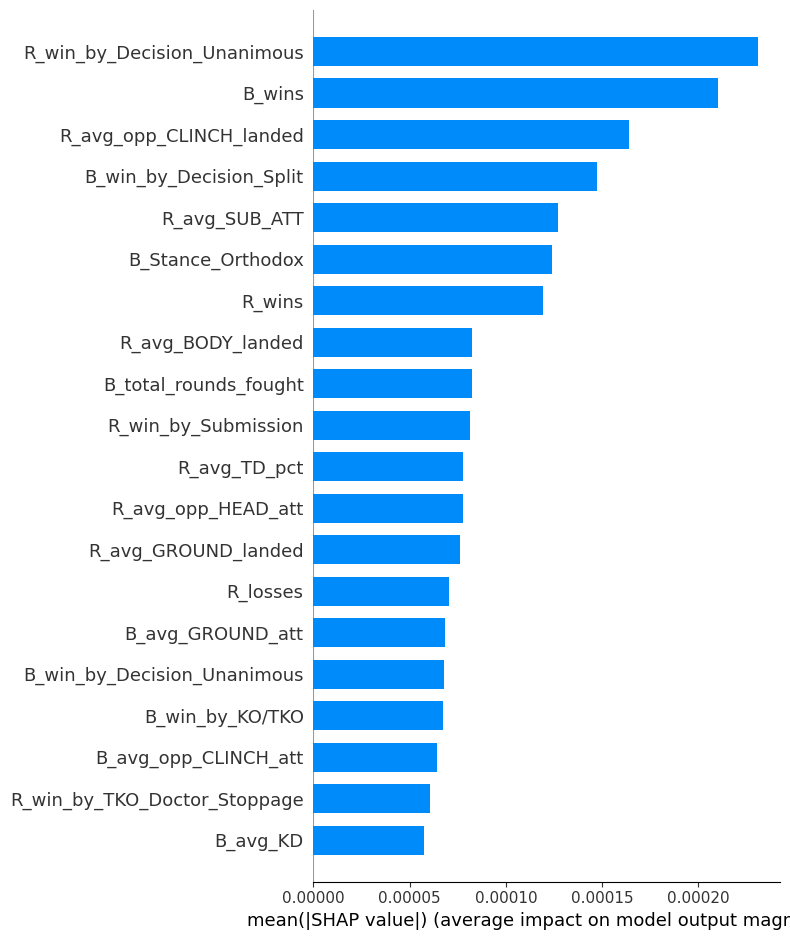

In [26]:
instance_index = 2
shap_values_instance = shap_values_deep_gradient[instance_index].reshape(1, -1)  # Reshape to match feature data shape

# Select the corresponding feature data for the instance
instance_features = train_features[instance_index].reshape(1, -1)

# Plot the summary plot for this instance
shap.summary_plot(shap_values_instance, instance_features, feature_names=X.columns, plot_type="bar")

After layer_one: torch.Size([5674, 256])
After layer_two: torch.Size([5674, 128])
After layer_three: torch.Size([5674, 64])
After layer_four: torch.Size([5674, 32])
After layer_five: torch.Size([5674, 16])
After output_layer: torch.Size([5674, 1])


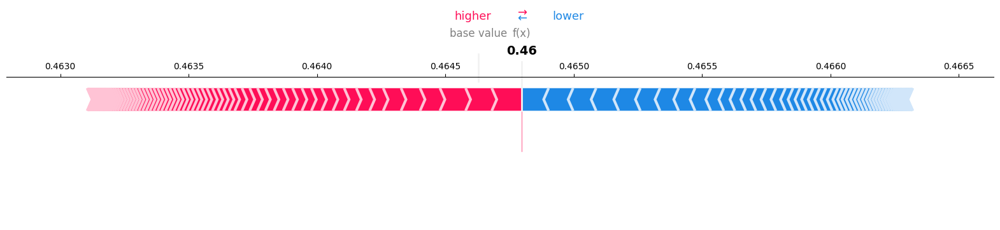

In [27]:
#force plot

instance_index = 0

# Extract SHAP values for the selected instance
shap_values_instance = shap_values_deep_gradient[instance_index].reshape(1, -1)

# Extract the feature values for the selected instance
instance_features = train_features[instance_index].numpy().reshape(1, -1)

# Calculate the baseline (average prediction) on the entire dataset
baseline_value = simplified_deep_model1(train_features).mean().item()

# Generate the force plot for the selected instance
shap.force_plot(
    baseline_value, 
    shap_values_instance, 
    instance_features, 
    feature_names=X.columns,
    matplotlib=True
)

After layer_one: torch.Size([5674, 256])
After layer_two: torch.Size([5674, 128])
After layer_three: torch.Size([5674, 64])
After layer_four: torch.Size([5674, 32])
After layer_five: torch.Size([5674, 16])
After output_layer: torch.Size([5674, 1])


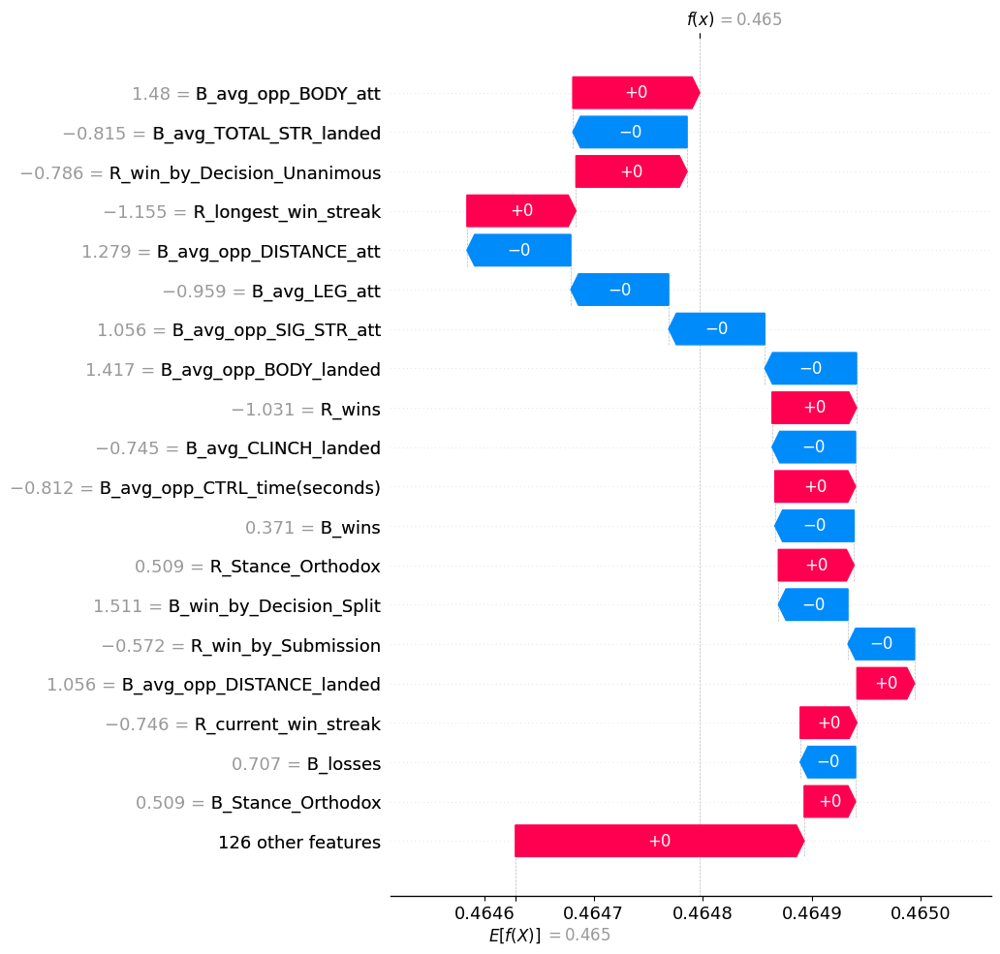

In [29]:
#waterfall plot


selected_instance_index = 0

shap_values_for_instance = shap_values_deep_gradient[selected_instance_index].flatten()

features_for_instance = train_features[selected_instance_index].numpy().flatten()

average_prediction = simplified_deep_model1(train_features).mean().item()

shap.waterfall_plot(
    shap.Explanation(
        values=shap_values_for_instance, 
        base_values=average_prediction, 
        data=features_for_instance, 
        feature_names=X.columns
    ),
    max_display=20
)



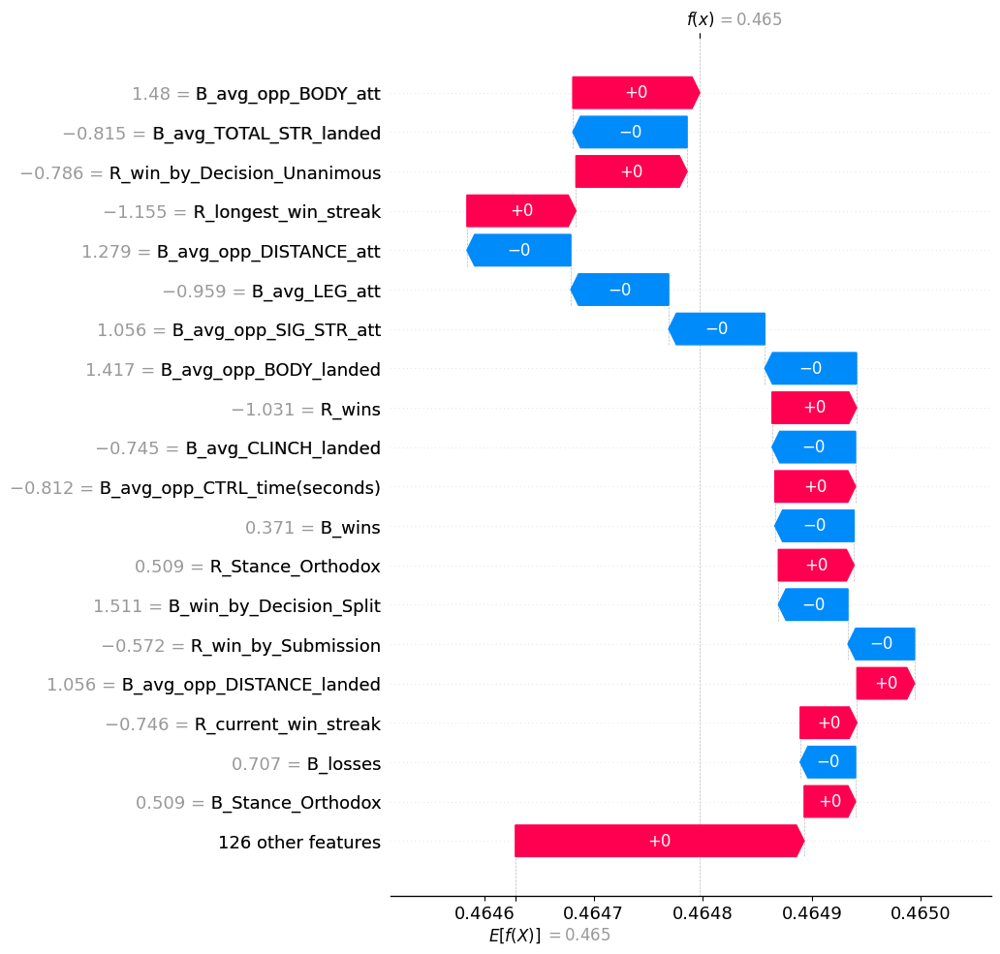

In [30]:
#optimizing values in waterfall plot to display

shap.waterfall_plot(
    shap.Explanation(
        values=shap_values_for_instance, 
        base_values=average_prediction, 
        data=features_for_instance, 
        feature_names=X.columns
    ),
    max_display=20
)

PermutationExplainer explainer: 5675it [06:01, 15.42it/s]                          


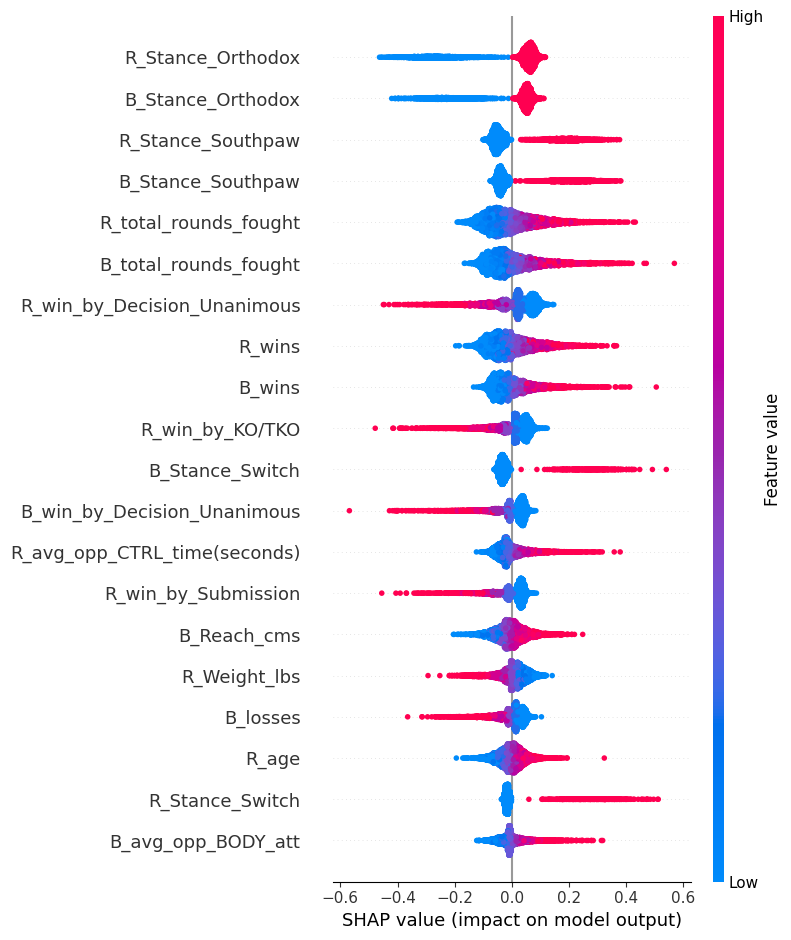

In [31]:
#shapley values for deep learning model

train_features = torch.tensor(X_train, dtype=torch.float32)

def model_predict(input_data):
    input_tensor = torch.tensor(input_data, dtype=torch.float32)
    deep_model3.eval()
    with torch.no_grad():
        predictions = deep_model3(input_tensor).numpy()
    return predictions

train_features_np = train_features.numpy()

explainer_deep = shap.Explainer(model_predict, train_features_np)

shap_values_deep = explainer_deep(train_features_np)

shap.summary_plot(shap_values_deep, train_features_np, feature_names=X.columns)



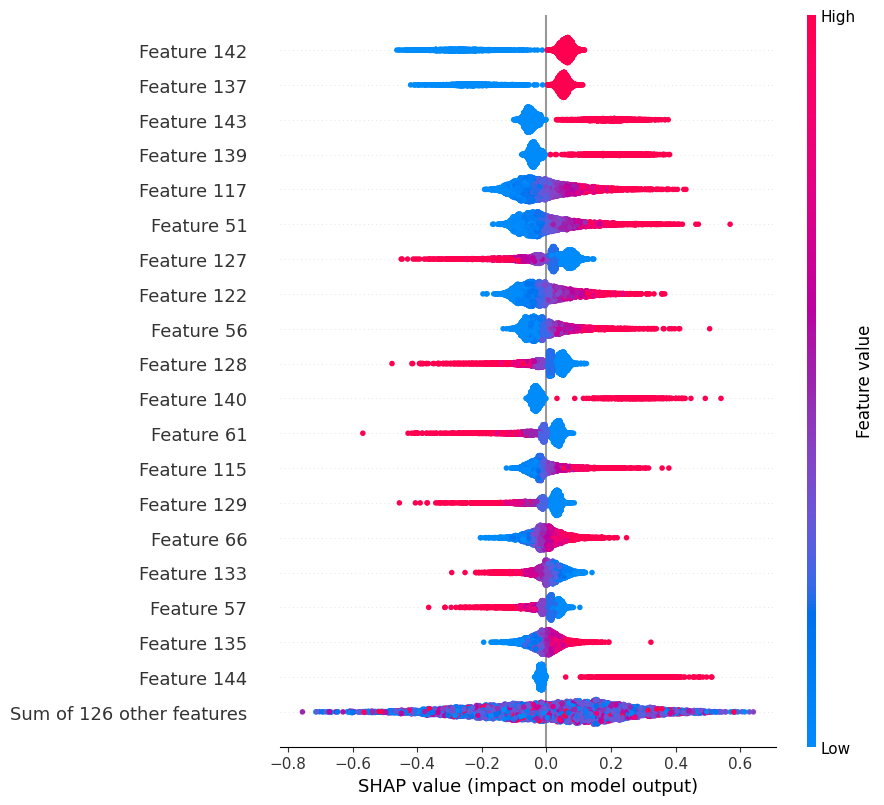

In [32]:
#beeswarm plot

shap.plots.beeswarm(shap_values_deep, max_display=20)

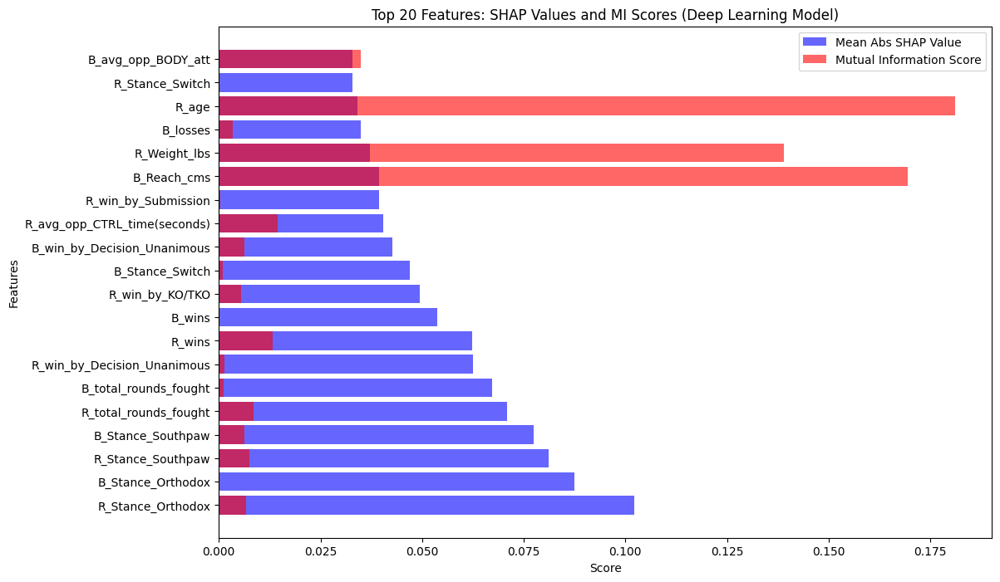

In [33]:
mean_abs_shap_values_deep = np.mean(np.abs(shap_values_deep.values), axis=0)

shap_df_deep = pd.DataFrame({
    'feature': X.columns,
    'mean_abs_shap_value_deep': mean_abs_shap_values_deep
})

shap_df_deep = shap_df_deep.sort_values(by='mean_abs_shap_value_deep', ascending=False)

top_20_features_deep = shap_df_deep.head(20)

top_20_features_deep = top_20_features_deep.merge(mi_df, on='feature')

plt.figure(figsize=(12, 8))
plt.barh(top_20_features_deep['feature'], top_20_features_deep['mean_abs_shap_value_deep'], color='blue', alpha=0.6, label='Mean Abs SHAP Value')
plt.barh(top_20_features_deep['feature'], top_20_features_deep['mi_score'], color='red', alpha=0.6, label='Mutual Information Score')
plt.xlabel('Score')
plt.ylabel('Features')
plt.title('Top 20 Features: SHAP Values and MI Scores (Deep Learning Model)')
plt.legend()
plt.show()

ENSEMBLE SHAPLEY
---

In [34]:
best_voting = joblib.load('savedModels/voting_clf.pkl')

In [35]:
best_voting_xgb = best_voting.estimators_[2]

shap_values_voting_xgb = shap.TreeExplainer(best_voting_xgb).shap_values(X_train)

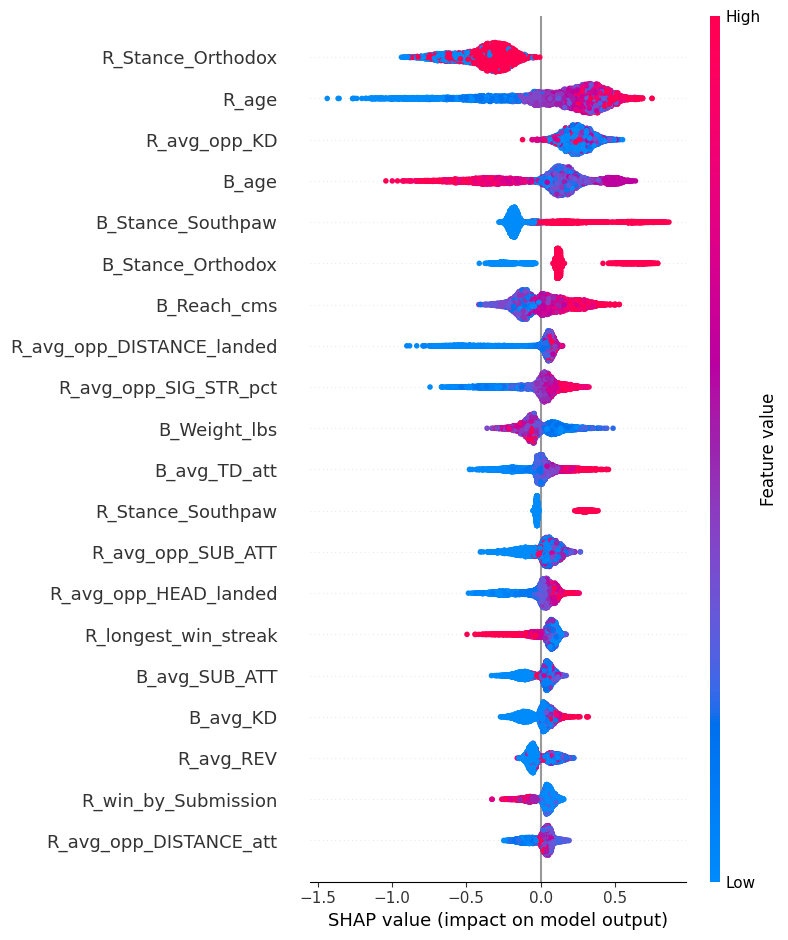

In [36]:
#summary plot

shap.summary_plot(shap_values_voting_xgb, X_train, feature_names=X.columns)

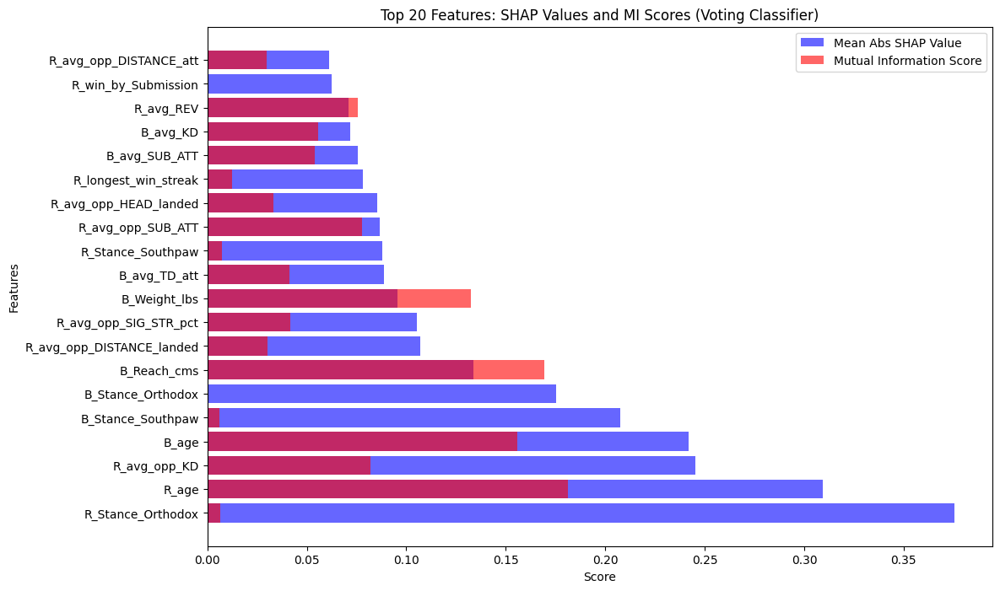

In [37]:
mean_abs_shap_values_voting_xgb = np.mean(np.abs(shap_values_voting_xgb), axis=0)

shap_df_voting_xgb = pd.DataFrame({
    'feature': X.columns,
    'mean_abs_shap_value_voting': mean_abs_shap_values_voting_xgb
})

shap_df_voting_xgb = shap_df_voting_xgb.sort_values(by='mean_abs_shap_value_voting', ascending=False)

top_20_features_voting_xgb = shap_df_voting_xgb.head(20)

top_20_features_voting_xgb = top_20_features_voting_xgb.merge(mi_df, on='feature')

plt.figure(figsize=(12, 8))
plt.barh(top_20_features_voting_xgb['feature'], top_20_features_voting_xgb['mean_abs_shap_value_voting'], color='blue', alpha=0.6, label='Mean Abs SHAP Value')
plt.barh(top_20_features_voting_xgb['feature'], top_20_features_voting_xgb['mi_score'], color='red', alpha=0.6, label='Mutual Information Score')
plt.xlabel('Score')
plt.ylabel('Features')
plt.title('Top 20 Features: SHAP Values and MI Scores (Voting Classifier)')
plt.legend()
plt.show()

In [38]:
best_voting_gb = best_voting.estimators_[4]

explainer_voting_gb = shap.Explainer(best_voting_gb)

shap_values_voting_gb = explainer_voting_gb.shap_values(X_train)

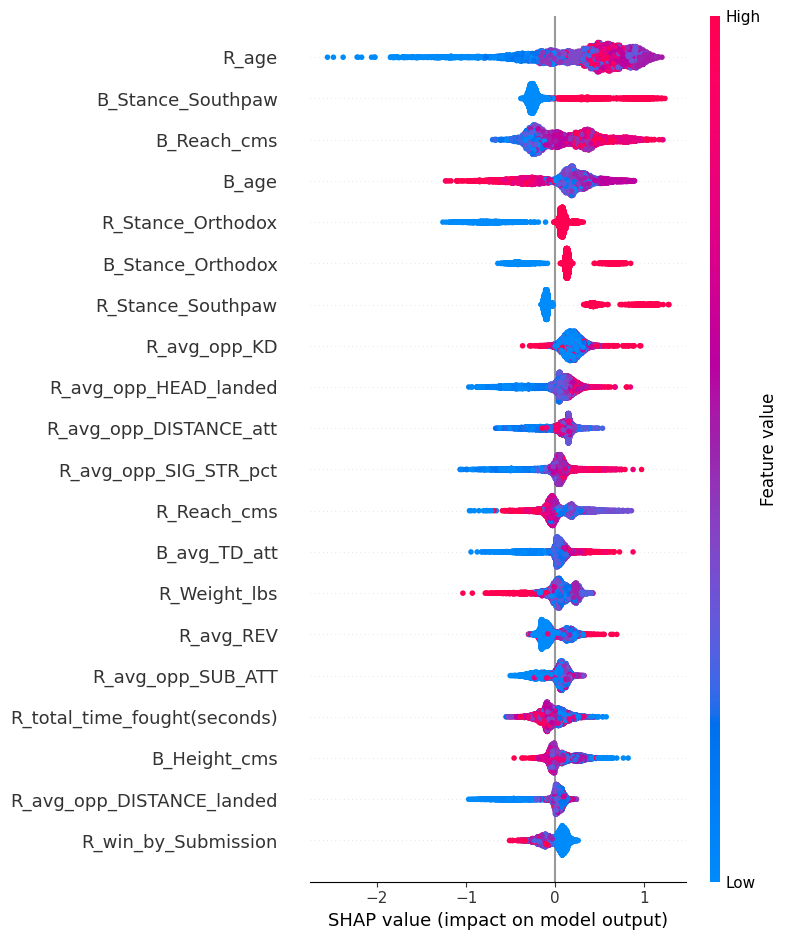

In [39]:
#summary plot

shap.summary_plot(shap_values_voting_gb, X_train, feature_names=X.columns)

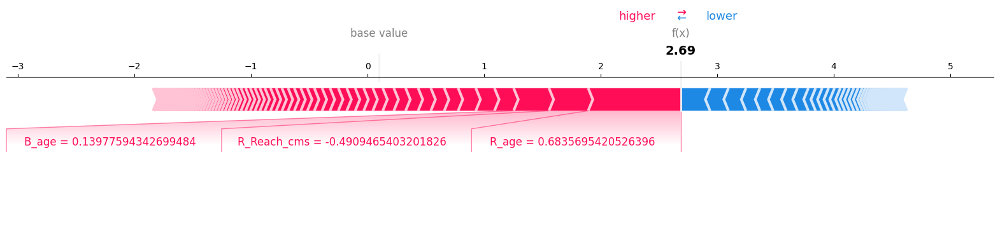

In [41]:
instance_index = 0  # You can choose any index based on the data
instance_features = X_train[instance_index]
shap_values_for_instance = shap_values_voting_gb[instance_index]

shap.force_plot(
    explainer_voting_gb.expected_value,  
    shap_values_for_instance,            
    instance_features,                   
    feature_names=X.columns,             
    matplotlib=True                      
)

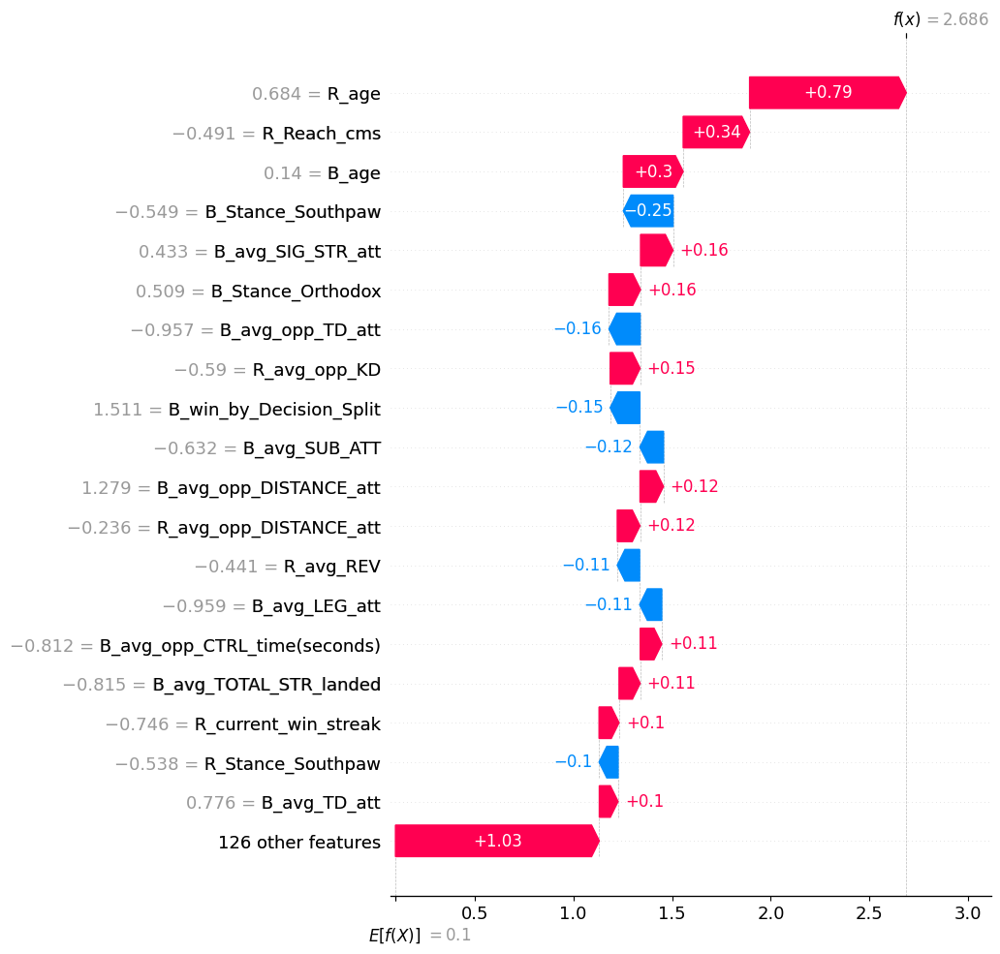

In [43]:
#waterfall plot

shap.waterfall_plot(
    shap.Explanation(
        values=shap_values_for_instance, 
        base_values=explainer_voting_gb.expected_value, 
        data=instance_features, 
        feature_names=X.columns
    ),
    max_display=20
)

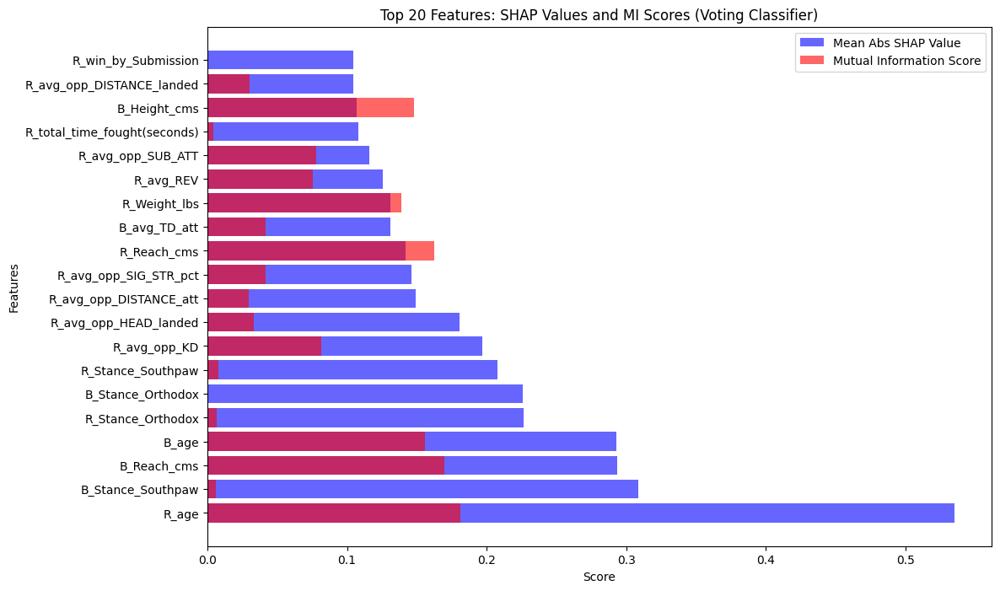

In [44]:
mean_abs_shap_values_gb = np.mean(np.abs(shap_values_voting_gb), axis=0)

shap_df_gb = pd.DataFrame({
    'feature': X.columns,
    'mean_abs_shap_value_gb': mean_abs_shap_values_gb
})

shap_df_gb = shap_df_gb.sort_values(by='mean_abs_shap_value_gb', ascending=False)

top_20_features_gb = shap_df_gb.head(20)

top_20_features_gb = top_20_features_gb.merge(mi_df, on='feature')

plt.figure(figsize=(12, 8))
plt.barh(top_20_features_gb['feature'], top_20_features_gb['mean_abs_shap_value_gb'], color='blue', alpha=0.6, label='Mean Abs SHAP Value')
plt.barh(top_20_features_gb['feature'], top_20_features_gb['mi_score'], color='red', alpha=0.6, label='Mutual Information Score')
plt.xlabel('Score')
plt.ylabel('Features')
plt.title('Top 20 Features: SHAP Values and MI Scores (Voting Classifier)')
plt.legend()
plt.show()
